### 05/17/2025: Curating Healthy Samples and Pathological Lesion Masks for Sampling

First, load the pathological masks. Separate 20 samples for testing.

In [59]:
import os 

pathological_ids = os.listdir("../../FCD2/Pathological/labels")
test_ids = [pathological_ids[i].split('_roi')[0] for i in range(20)] # 20 test masks
train_ids = [pathological_ids[i].split('_roi')[0] for i in range(84) if pathological_ids[i].split('_roi')[0] not in test_ids] # 64 train masks
print(len(train_ids))
print(len(test_ids))    

64
20


Use the first 50 pathological masks as candidates to be used for inpainting into healthy MR

In [60]:
synth_mask_ids = train_ids[0:50] # first 50 train masks
synth_mask_paths = [
    mask 
    for mask in pathological_ids 
    if any(synth_mask_id in mask for synth_mask_id in synth_mask_ids)
]
print(synth_mask_paths)

['sub-00125_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00050_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00027_acq-traAcpc4mm_FLAIR_roi.nii.gz', 'sub-00004_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00081_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00073_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00100_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00097_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00099_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00123_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00060_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00112_acq-tra4mm_FLAIR_roi.nii.gz', 'sub-00146_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00059_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00132_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00009_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00141_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00053_acq-traacpcVNS_FLAIR_roi.nii.gz', 'sub-00014_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00128_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00020_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00071_acq-T2sel_FLAIR_roi.nii.gz', 'sub-00091_acq-tse3dvfl_FLAIR_roi.nii.gz', 'sub-00044_acq-T2sel_FLAIR_roi.nii.gz'

Pair the first 50 healthy scans with the first 50 masks

In [61]:
healthy_scan_paths = os.listdir("../../FCD2/Normal/images")[0:50]
print(healthy_scan_paths)

['sub-00155_acq-T2sel_FLAIR.nii.gz', 'sub-00026_acq-T2sel_FLAIR.nii.gz', 'sub-00164_acq-T2sel_FLAIR.nii.gz', 'sub-00017_acq-T2sel_FLAIR.nii.gz', 'sub-00111_acq-T2sel_FLAIR.nii.gz', 'sub-00127_acq-T2sel_FLAIR.nii.gz', 'sub-00054_acq-T2sel_FLAIR.nii.gz', 'sub-00152_acq-T2sel_FLAIR.nii.gz', 'sub-00021_acq-T2sel_FLAIR.nii.gz', 'sub-00158_acq-T2sel_FLAIR.nii.gz', 'sub-00169_acq-T2sel_FLAIR.nii.gz', 'sub-00163_acq-T2sel_FLAIR.nii.gz', 'sub-00028_acq-T2sel_FLAIR.nii.gz', 'sub-00022_acq-T2sel_FLAIR.nii.gz', 'sub-00151_acq-T2sel_FLAIR.nii.gz', 'sub-00096_acq-T2sel_FLAIR.nii.gz', 'sub-00057_acq-T2sel_FLAIR.nii.gz', 'sub-00124_acq-T2sel_FLAIR.nii.gz', 'sub-00013_acq-T2sel_FLAIR.nii.gz', 'sub-00160_acq-T2sel_FLAIR.nii.gz', 'sub-00019_acq-T2sel_FLAIR.nii.gz', 'sub-00129_acq-T2sel_FLAIR.nii.gz', 'sub-00025_acq-T2sel_FLAIR.nii.gz', 'sub-00156_acq-T2sel_FLAIR.nii.gz', 'sub-00167_acq-T2sel_FLAIR.nii.gz', 'sub-00118_acq-T2sel_FLAIR.nii.gz', 'sub-00119_acq-T2sel_FLAIR.nii.gz', 'sub-00113_acq-T2sel_FLAIR.

In [62]:
pairs = [[healthy_scan_paths[i], synth_mask_paths[i]] for i in range(len(healthy_scan_paths))] # healthy scan, mask
print(pairs)

[['sub-00155_acq-T2sel_FLAIR.nii.gz', 'sub-00125_acq-tse3dvfl_FLAIR_roi.nii.gz'], ['sub-00026_acq-T2sel_FLAIR.nii.gz', 'sub-00050_acq-tse3dvfl_FLAIR_roi.nii.gz'], ['sub-00164_acq-T2sel_FLAIR.nii.gz', 'sub-00027_acq-traAcpc4mm_FLAIR_roi.nii.gz'], ['sub-00017_acq-T2sel_FLAIR.nii.gz', 'sub-00004_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00111_acq-T2sel_FLAIR.nii.gz', 'sub-00081_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00127_acq-T2sel_FLAIR.nii.gz', 'sub-00073_acq-tse3dvfl_FLAIR_roi.nii.gz'], ['sub-00054_acq-T2sel_FLAIR.nii.gz', 'sub-00100_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00152_acq-T2sel_FLAIR.nii.gz', 'sub-00097_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00021_acq-T2sel_FLAIR.nii.gz', 'sub-00099_acq-tse3dvfl_FLAIR_roi.nii.gz'], ['sub-00158_acq-T2sel_FLAIR.nii.gz', 'sub-00123_acq-tse3dvfl_FLAIR_roi.nii.gz'], ['sub-00169_acq-T2sel_FLAIR.nii.gz', 'sub-00060_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00163_acq-T2sel_FLAIR.nii.gz', 'sub-00112_acq-tra4mm_FLAIR_roi.nii.gz'], ['sub-00028_acq-T2sel_FLAIR.nii.gz', 'sub-

Generate GIFs of pairs to verify lesion placement

In [63]:
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
import imageio
import os
from PIL import Image
import io

def create_overlay_frame(scan_slice, mask_slice):
    plt.figure(figsize=(6,6))
    plt.imshow(scan_slice, cmap='gray')
    plt.imshow(mask_slice, alpha=0.5, cmap='Blues')
    plt.axis('off')
    
    # Convert plot to image
    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
    plt.close()
    buf.seek(0)
    return Image.open(buf)

for pair in pairs:
    try:
        scan_path = os.path.join("../../FCD2/Normal/images", pair[0]) 
        mask_path = os.path.join("../../FCD2/Pathological/labels", pair[1])  
        
        # Load scan and mask
        scan = nib.load(scan_path)
        mask = nib.load(mask_path)
        
        scan_data = scan.get_fdata()
        mask_data = mask.get_fdata()
        
        # Verify dimensions match
        if scan_data.shape != mask_data.shape:
            print(f"Skipping {pair[0]} - dimension mismatch: scan {scan_data.shape}, mask {mask_data.shape}")
            continue
            
        # Create axial view GIF
        axial_frames = []
        for z in range(scan_data.shape[2]):  # iterate through all z slices
            if np.any(mask_data[:,:,z]):  # only include slices that have mask data
                frame = create_overlay_frame(scan_data[:,:,z], mask_data[:,:,z])
                axial_frames.append(frame)
        
        # Create sagittal view GIF
        sagittal_frames = []
        for x in range(scan_data.shape[0]):  # iterate through all sagittal slices
            if np.any(mask_data[x,:,:]):  # only include slices that have mask data
                frame = create_overlay_frame(
                    scan_data[x,:,:].T, 
                    mask_data[x,:,:].T
                )
                sagittal_frames.append(frame)
        
        # Only save if frames were created
        if axial_frames and sagittal_frames:
            # Save GIFs
            output_dir = "overlay_gifs"
            os.makedirs(output_dir, exist_ok=True)
            
            # Save with 100ms duration per frame (10 fps)
            imageio.mimsave(
                f'{output_dir}/{pair[0]}_axial.gif', 
                axial_frames, 
                duration=100
            )
            imageio.mimsave(
                f'{output_dir}/{pair[0]}_sagittal.gif', 
                sagittal_frames, 
                duration=100
            )
            
            print(f"Created GIFs for {pair[0]}")
        else:
            print(f"No mask data found for {pair[0]}")
            
    except Exception as e:
        print(f"Error processing {pair[0]}: {str(e)}")

Created GIFs for sub-00155_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00026_acq-T2sel_FLAIR.nii.gz
Skipping sub-00164_acq-T2sel_FLAIR.nii.gz - dimension mismatch: scan (160, 256, 256), mask (336, 384, 36)
Created GIFs for sub-00017_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00111_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00127_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00054_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00152_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00021_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00158_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00169_acq-T2sel_FLAIR.nii.gz
Skipping sub-00163_acq-T2sel_FLAIR.nii.gz - dimension mismatch: scan (160, 256, 256), mask (280, 320, 35)
Created GIFs for sub-00028_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00022_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00151_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00096_acq-T2sel_FLAIR.nii.gz
Created GIFs for sub-00057_acq-T2sel_FLAIR.nii.gz
Skipping sub-00124_acq-T2sel_FLAIR.nii

Note pairs selected from GIFs that have realistic lesion alignment with healthy scan.

In [ ]:
good_image_ids = [
    'sub-00013_acq-T2sel_FLAIR.nii.gz', 'sub-00017_acq-T2sel_FLAIR.nii.gz', 'sub-00021_acq-T2sel_FLAIR.nii.gz',
    'sub-00023_acq-T2sel_FLAIR.nii.gz', 'sub-00028_acq-T2sel_FLAIR.nii.gz', 'sub-00029_acq-T2sel_FLAIR.nii.gz',
    'sub-00051_acq-T2sel_FLAIR.nii.gz', 'sub-00054_acq-T2sel_FLAIR.nii.gz', 'sub-00056_acq-T2sel_FLAIR.nii.gz',
    'sub-00094_acq-T2sel_FLAIR.nii.gz', 'sub-00111_acq-T2sel_FLAIR.nii.gz', 'sub-00117_acq-T2sel_FLAIR.nii.gz',
    'sub-00118_acq-T2sel_FLAIR.nii.gz', 'sub-00119_acq-T2sel_FLAIR.nii.gz', 'sub-00127_acq-T2sel_FLAIR.nii.gz',
    'sub-00129_acq-T2sel_FLAIR.nii.gz', 'sub-00150_acq-T2sel_FLAIR.nii.gz', 'sub-00152_acq-T2sel_FLAIR.nii.gz',
    'sub-00156_acq-T2sel_FLAIR.nii.gz', 'sub-00157_acq-T2sel_FLAIR.nii.gz', 'sub-00160_acq-T2sel_FLAIR.nii.gz',
    'sub-00161_acq-T2sel_FLAIR.nii.gz', 'sub-00165_acq-T2sel_FLAIR.nii.gz', 'sub-00166_acq-T2sel_FLAIR.nii.gz',
    'sub-00168_acq-T2sel_FLAIR.nii.gz', 'sub-00169_acq-T2sel_FLAIR.nii.gz'
]

# Only keep pairs where either element contains a good image id
filtered_pairs = []
for pair in pairs:
    if any(good_id in pair for good_id in good_image_ids):
        filtered_pairs.append(pair)
pairs = filtered_pairs

# Delete all GIFs in overlay_gifs/ that are not in good_image_ids
import os

gif_dir = "overlay_gifs"
if os.path.exists(gif_dir):
    for fname in os.listdir(gif_dir):
        if fname.endswith(".gif"):
            # Extract the base name (should match one of the good_image_ids)
            for suffix in ["_axial.gif", "_sagittal.gif"]:
                if fname.endswith(suffix):
                    base = fname[:-len(suffix)]
                    break
            else:
                continue  # Skip files that don't match expected pattern

            if base not in good_image_ids:
                try:
                    os.remove(os.path.join(gif_dir, fname))
                    print(f"Deleted {fname}")
                except Exception as e:
                    print(f"Could not delete {fname}: {e}")

Deleted sub-00167_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00067_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00096_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00114_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00110_acq-T2sel_FLAIR.nii.gz_axial.gif
Deleted sub-00096_acq-T2sel_FLAIR.nii.gz_axial.gif
Deleted sub-00114_acq-T2sel_FLAIR.nii.gz_axial.gif
Deleted sub-00026_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00011_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00162_acq-T2sel_FLAIR.nii.gz_axial.gif
Deleted sub-00155_acq-T2sel_FLAIR.nii.gz_axial.gif
Deleted sub-00069_acq-T2sel_FLAIR.nii.gz_axial.gif
Deleted sub-00151_acq-T2sel_FLAIR.nii.gz_axial.gif
Deleted sub-00159_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00025_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00155_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00162_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00012_acq-T2sel_FLAIR.nii.gz_sagittal.gif
Deleted sub-00159_acq-T2sel_FLAIR.nii.gz_axial.gi

These filtered pairs (those with lesions in "realistic" locations) will be used for sampling and possibly later as synthetic data.

In [65]:
print(filtered_pairs)
print(len(filtered_pairs)) # pairs are still [image, scan]

[['sub-00017_acq-T2sel_FLAIR.nii.gz', 'sub-00004_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00111_acq-T2sel_FLAIR.nii.gz', 'sub-00081_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00127_acq-T2sel_FLAIR.nii.gz', 'sub-00073_acq-tse3dvfl_FLAIR_roi.nii.gz'], ['sub-00054_acq-T2sel_FLAIR.nii.gz', 'sub-00100_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00152_acq-T2sel_FLAIR.nii.gz', 'sub-00097_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00021_acq-T2sel_FLAIR.nii.gz', 'sub-00099_acq-tse3dvfl_FLAIR_roi.nii.gz'], ['sub-00169_acq-T2sel_FLAIR.nii.gz', 'sub-00060_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00028_acq-T2sel_FLAIR.nii.gz', 'sub-00146_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00013_acq-T2sel_FLAIR.nii.gz', 'sub-00014_acq-tse3dvfl_FLAIR_roi.nii.gz'], ['sub-00160_acq-T2sel_FLAIR.nii.gz', 'sub-00128_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00129_acq-T2sel_FLAIR.nii.gz', 'sub-00071_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00156_acq-T2sel_FLAIR.nii.gz', 'sub-00044_acq-T2sel_FLAIR_roi.nii.gz'], ['sub-00118_acq-T2sel_FLAIR.nii.gz', 'sub-00095_acq-T2

View selected pairs

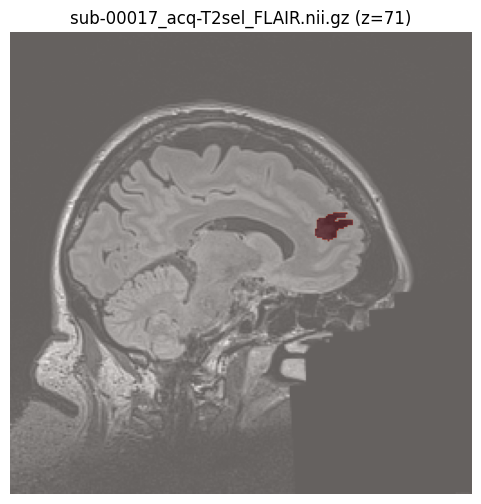

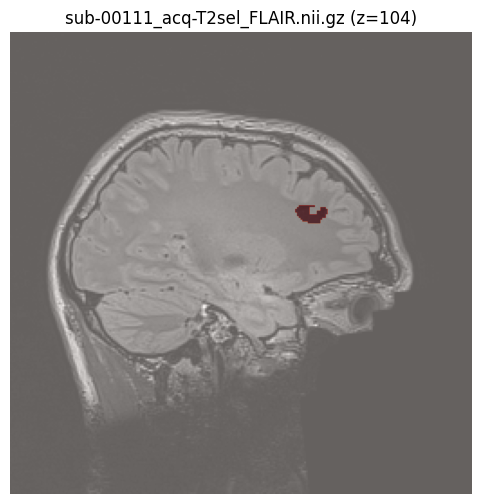

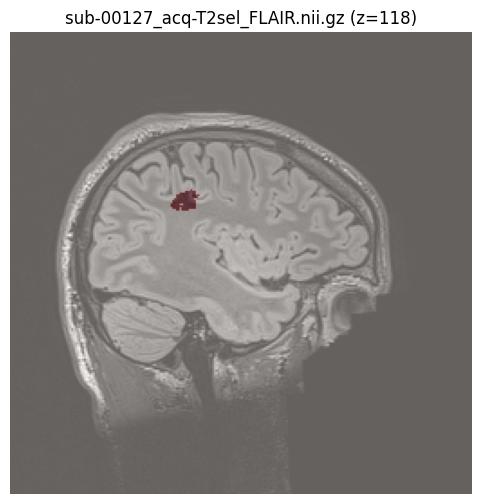

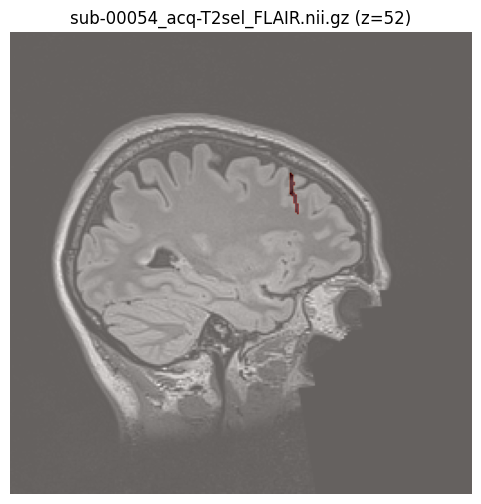

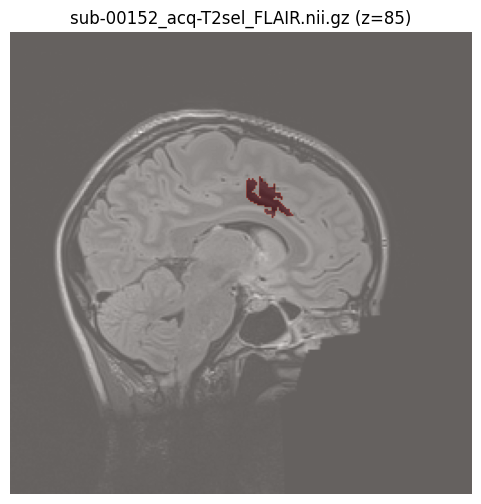

...

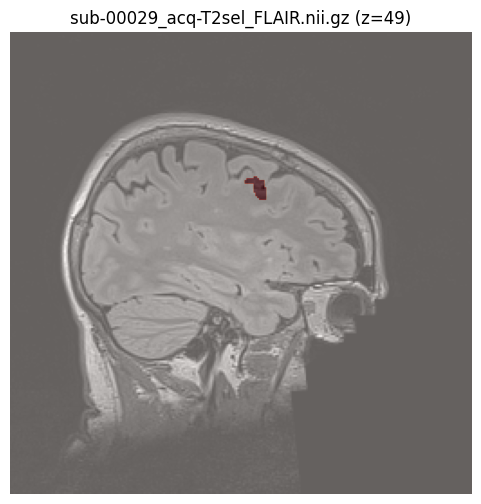

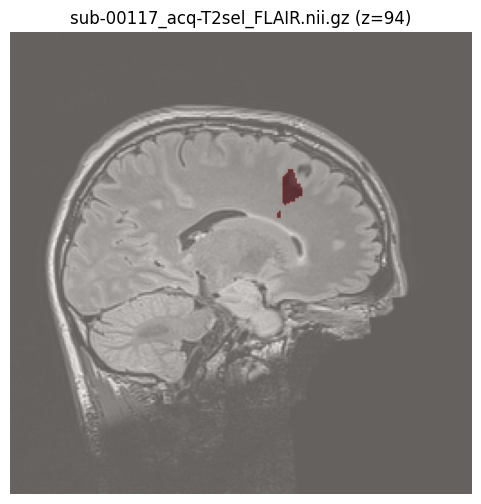

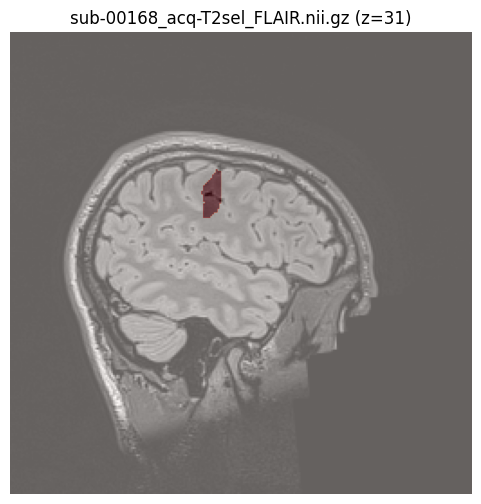

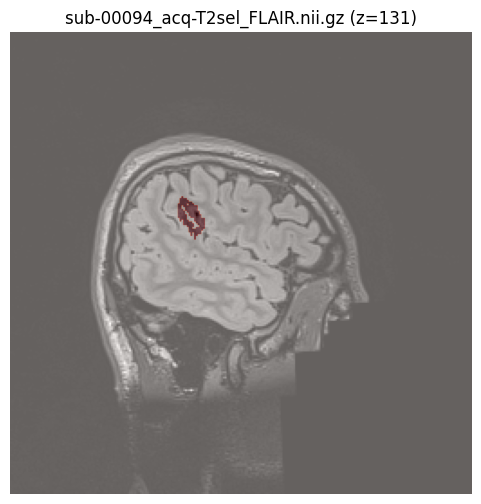

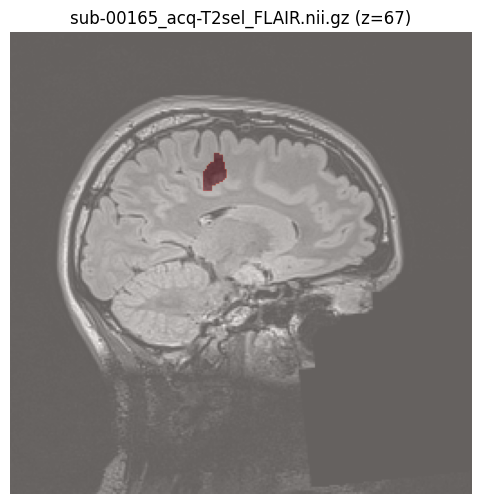

In [66]:
for pair in filtered_pairs:
    scan_path = os.path.join("../../FCD2/Normal/images", pair[0])
    mask_path = os.path.join("../../FCD2/Pathological/labels", pair[1])

    # Load scan and mask
    scan_nii = nib.load(scan_path)
    mask_nii = nib.load(mask_path)
    scan = scan_nii.get_fdata()
    mask = mask_nii.get_fdata()

    # Find center of mask clump of 1s
    mask_indices = np.argwhere(mask > 0.5)
    if mask_indices.size == 0:
        print(f"No mask found for {pair[1]}")
        continue
    center_idx = np.mean(mask_indices, axis=0).astype(int)
    z, y, x = center_idx

    # Show axial slice at center of mask
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    scan_slice = scan[z, :, :]
    mask_slice = mask[z, :, :]

    ax.imshow(scan_slice.T, cmap='gray', origin='lower')
    ax.imshow(mask_slice.T, cmap='Reds', alpha=0.4, origin='lower')
    ax.set_title(f"{pair[0]} (z={z})")
    ax.axis('off')
    plt.show()

So that we don't produce lesions in brain regions already in the dataset, we flip and verify each scan:

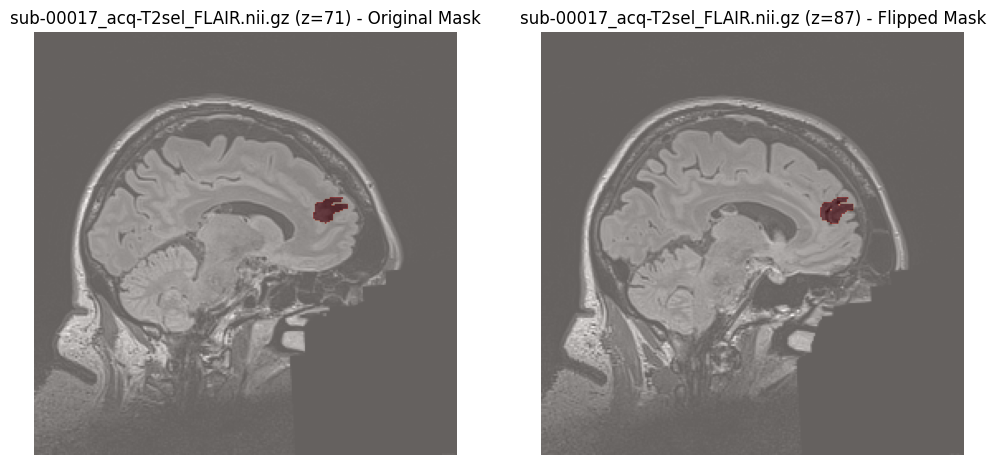

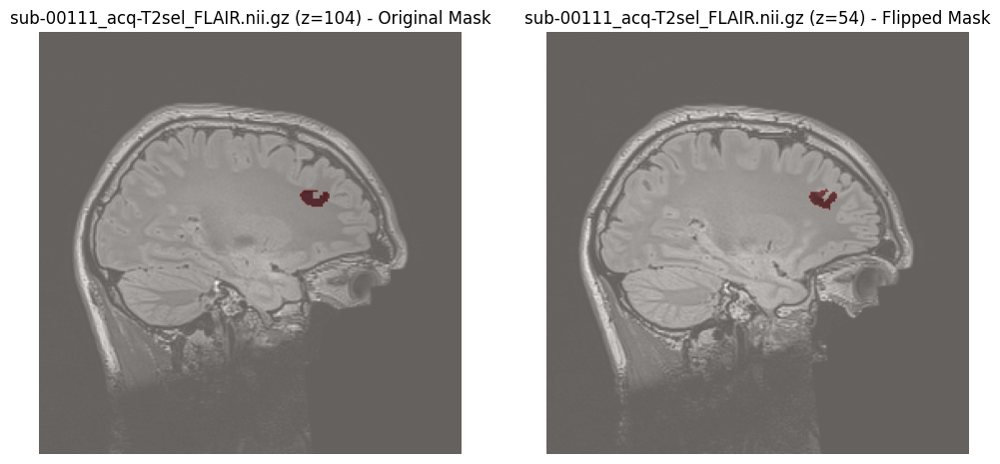

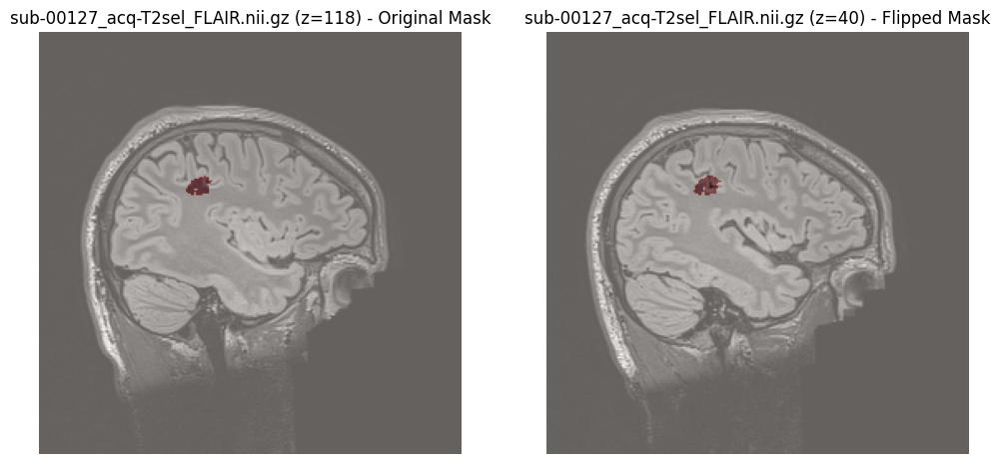

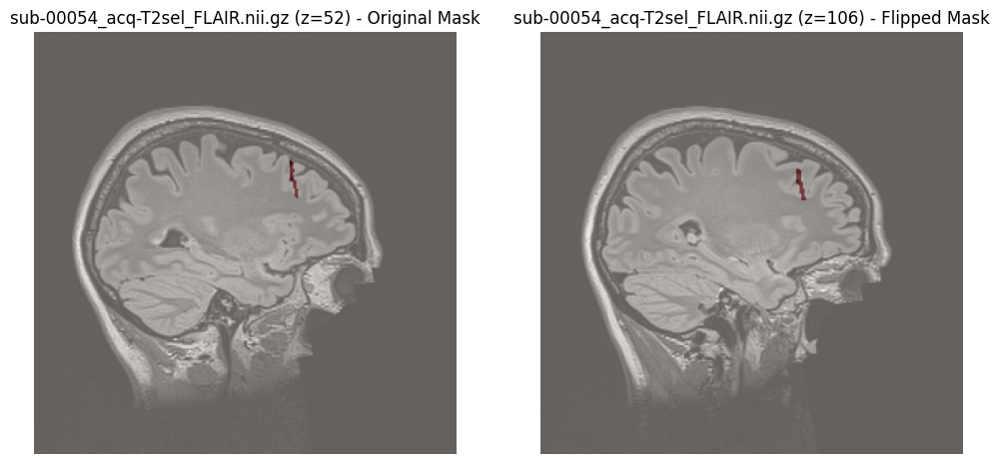

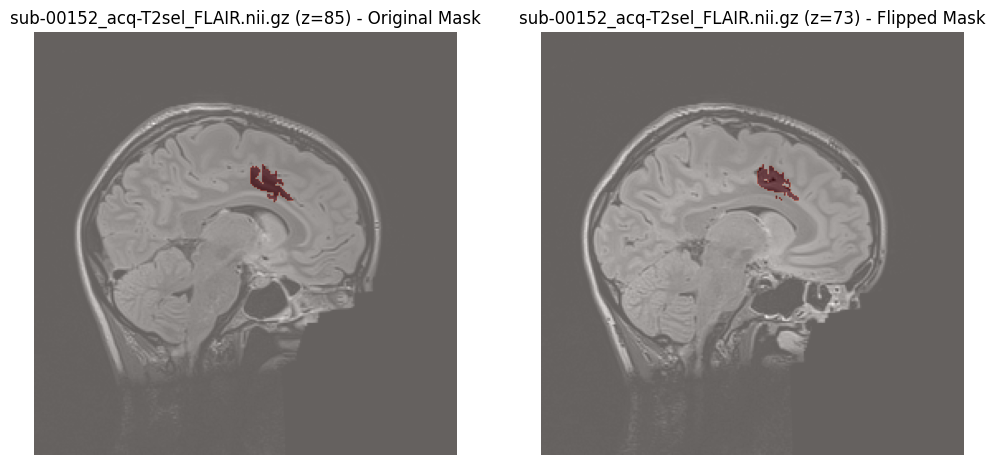

...

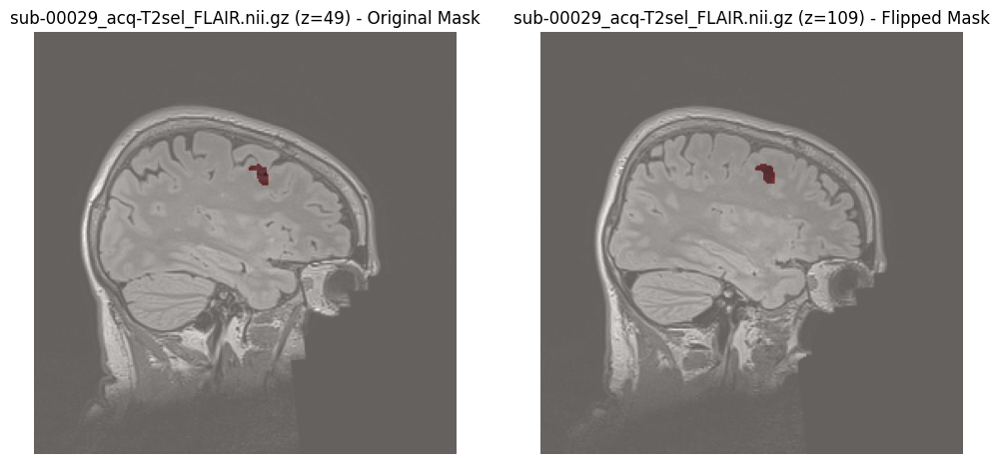

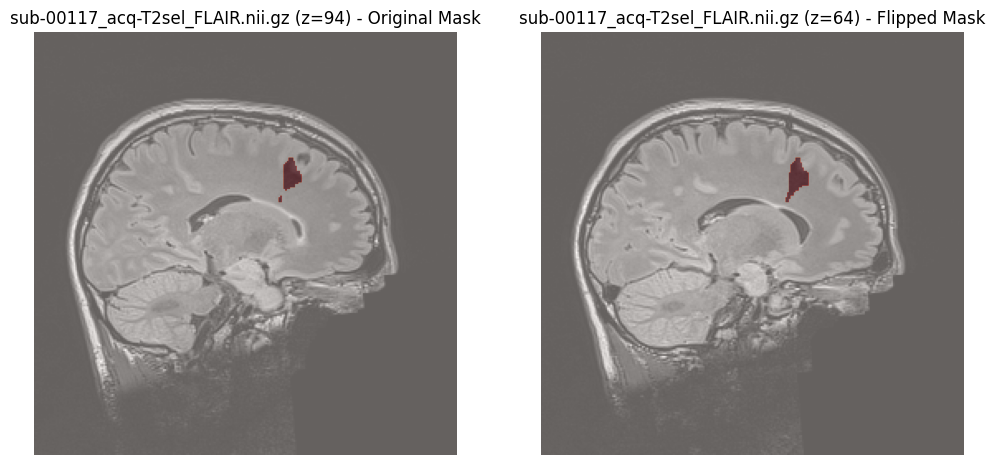

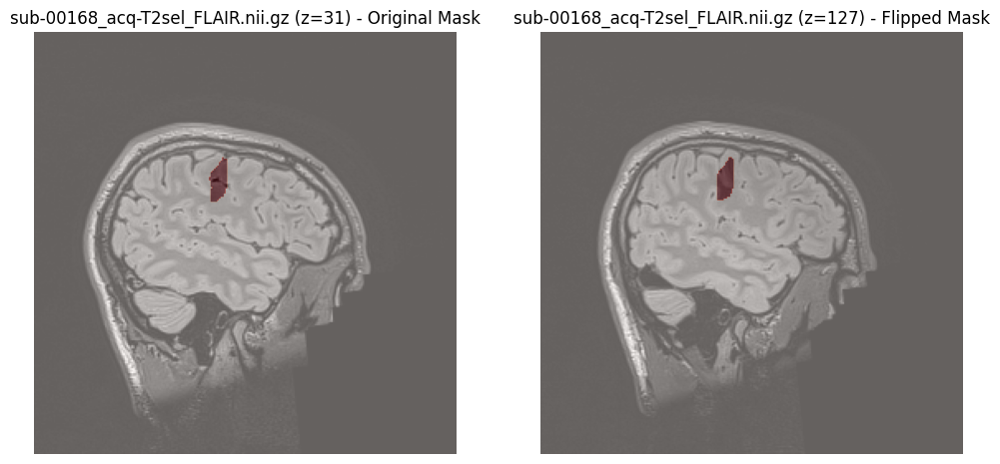

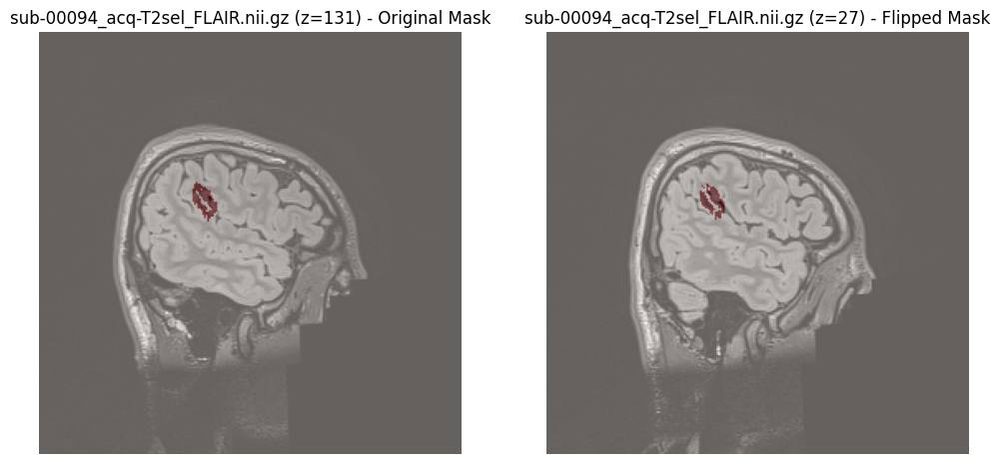

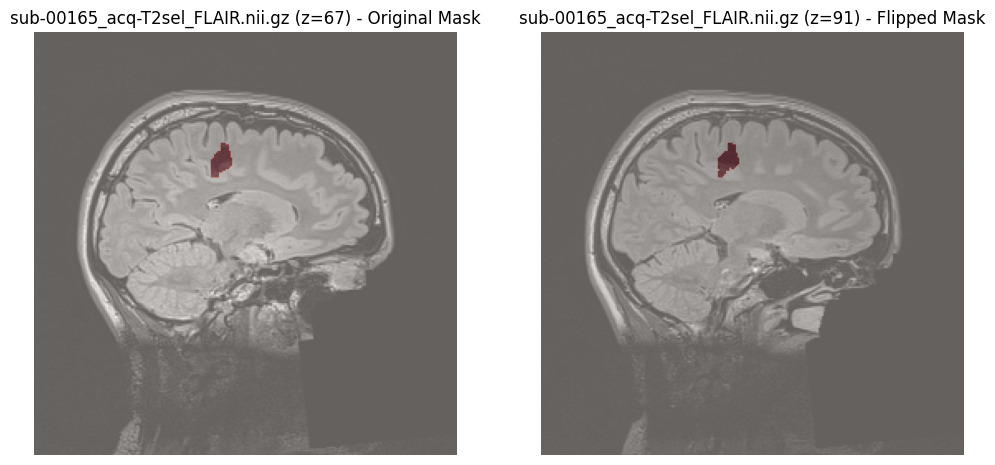

In [67]:
for pair in filtered_pairs:
    scan_path = os.path.join("../../FCD2/Normal/images", pair[0])
    mask_path = os.path.join("../../FCD2/Pathological/labels", pair[1])

    scan_nii = nib.load(scan_path)
    mask_nii = nib.load(mask_path)
    scan = scan_nii.get_fdata()
    mask = mask_nii.get_fdata()

    mask_indices = np.argwhere(mask > 0.5)
    if mask_indices.size == 0:
        print(f"No mask found for {pair[1]}")
        continue
    center_idx = np.mean(mask_indices, axis=0).astype(int)
    z, y, x = center_idx

    flipped_mask = np.flip(mask, axis=0)

    flipped_mask_indices = np.argwhere(flipped_mask > 0.5)
    if flipped_mask_indices.size == 0:
        print(f"No mask found for {pair[1]} after flipping")
        continue
    flipped_center_idx = np.mean(flipped_mask_indices, axis=0).astype(int)
    flipped_z, flipped_y, flipped_x = flipped_center_idx

    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    scan_slice = scan[z, :, :]
    mask_slice = mask[z, :, :]
    axs[0].imshow(scan_slice.T, cmap='gray', origin='lower')
    axs[0].imshow(mask_slice.T, cmap='Reds', alpha=0.4, origin='lower')
    axs[0].set_title(f"{pair[0]} (z={z}) - Original Mask")
    axs[0].axis('off')

    flipped_scan_slice = scan[flipped_z, :, :]
    flipped_mask_slice = flipped_mask[flipped_z, :, :]
    axs[1].imshow(flipped_scan_slice.T, cmap='gray', origin='lower')
    axs[1].imshow(flipped_mask_slice.T, cmap='Reds', alpha=0.4, origin='lower')
    axs[1].set_title(f"{pair[0]} (z={flipped_z}) - Flipped Mask")
    axs[1].axis('off')

    plt.show()

Saving the flipped masks to the sampling folder

In [68]:
for pair in filtered_pairs:
    mask_path = os.path.join("../../FCD2/Pathological/labels", pair[1])

    mask_nii = nib.load(mask_path)
    mask = mask_nii.get_fdata()

    # Flip mask along the first axis
    flipped_mask = np.flip(mask, axis=0)

    # Save the flipped mask to ./sampling_labels with the same filename as the original mask
    output_dir = "./sampling_labels"
    os.makedirs(output_dir, exist_ok=True)
    output_path = os.path.join(output_dir, pair[1])

    flipped_mask_nii = nib.Nifti1Image(flipped_mask, mask_nii.affine, mask_nii.header)
    nib.save(flipped_mask_nii, output_path)

Moving the corresponding healthy scans to sampling folder

In [69]:
import shutil

src_dir = "../../FCD2/Normal/images"
dst_dir = "./sampling_images"
os.makedirs(dst_dir, exist_ok=True)

for img_id in good_image_ids:
    src_path = os.path.join(src_dir, img_id)
    dst_path = os.path.join(dst_dir, img_id)
    if os.path.exists(src_path):
        shutil.copy2(src_path, dst_path)
        print(f"Copied {img_id} to {dst_dir}")
    else:
        print(f"Source image not found: {src_path}")


Copied sub-00013_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00017_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00021_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00023_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00028_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00029_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00051_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00054_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00056_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00094_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00111_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00117_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00118_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00119_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00127_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00129_acq-T2sel_FLAIR.nii.gz to ./sampling_images
Copied sub-00150_acq-T2s

Create a mapping for new IDs for more seamless sampling with the Pseudo-3D inpainting DM

Renamed image: sub-00017_acq-T2sel_FLAIR.nii.gz -> sub-99901_acq-T2sel_FLAIR.nii.gz
Renamed label: sub-00004_acq-T2sel_FLAIR_roi.nii.gz -> sub-99901_acq-T2sel_FLAIR_roi.nii.gz
Renamed image: sub-00111_acq-T2sel_FLAIR.nii.gz -> sub-99902_acq-T2sel_FLAIR.nii.gz
Renamed label: sub-00081_acq-T2sel_FLAIR_roi.nii.gz -> sub-99902_acq-T2sel_FLAIR_roi.nii.gz
Renamed image: sub-00127_acq-T2sel_FLAIR.nii.gz -> sub-99903_acq-T2sel_FLAIR.nii.gz
Renamed label: sub-00073_acq-tse3dvfl_FLAIR_roi.nii.gz -> sub-99903_acq-tse3dvfl_FLAIR_roi.nii.gz
Renamed image: sub-00054_acq-T2sel_FLAIR.nii.gz -> sub-99904_acq-T2sel_FLAIR.nii.gz
Renamed label: sub-00100_acq-T2sel_FLAIR_roi.nii.gz -> sub-99904_acq-T2sel_FLAIR_roi.nii.gz
Renamed image: sub-00152_acq-T2sel_FLAIR.nii.gz -> sub-99905_acq-T2sel_FLAIR.nii.gz
Renamed label: sub-00097_acq-T2sel_FLAIR_roi.nii.gz -> sub-99905_acq-T2sel_FLAIR_roi.nii.gz
Renamed image: sub-00021_acq-T2sel_FLAIR.nii.gz -> sub-99906_acq-T2sel_FLAIR.nii.gz
Renamed label: sub-00099_acq-t

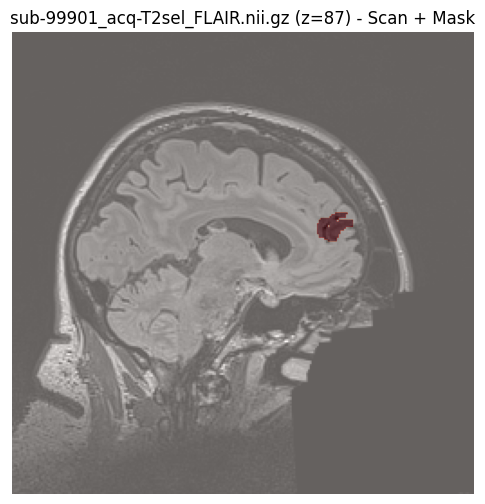

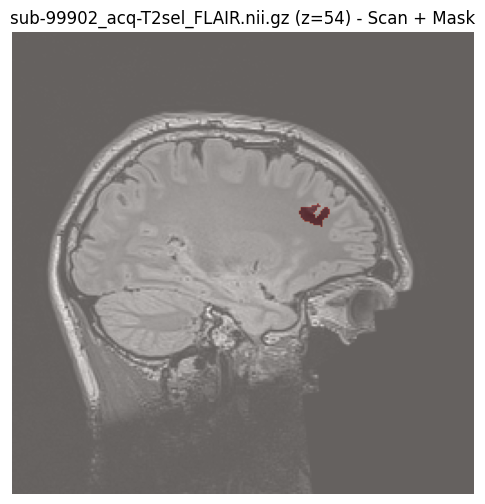

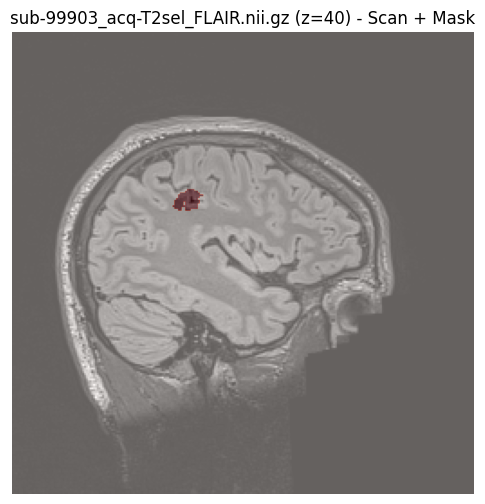

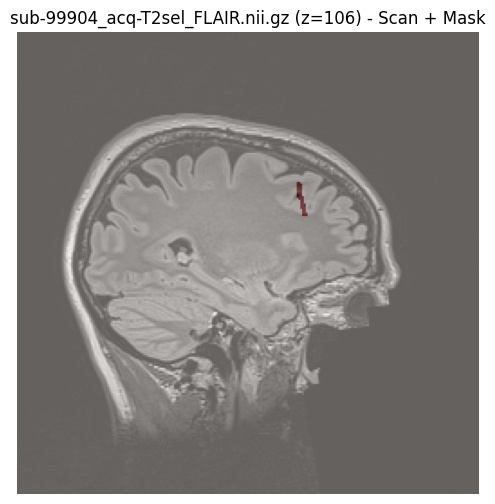

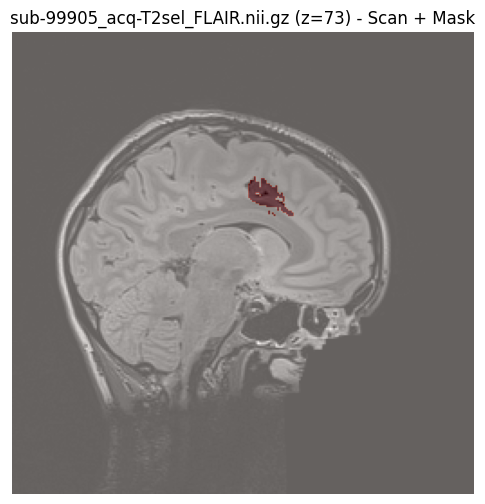

...

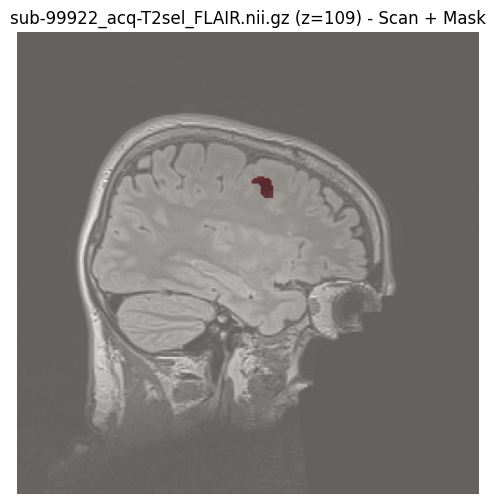

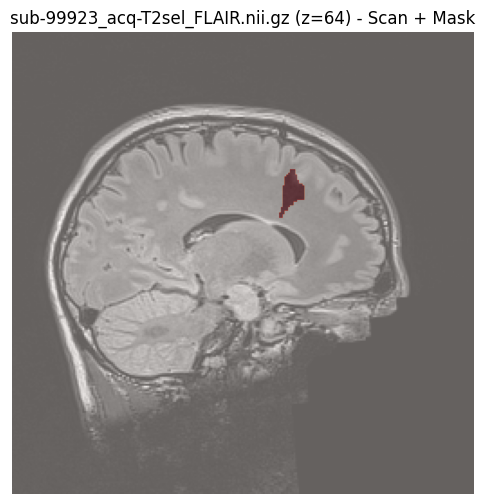

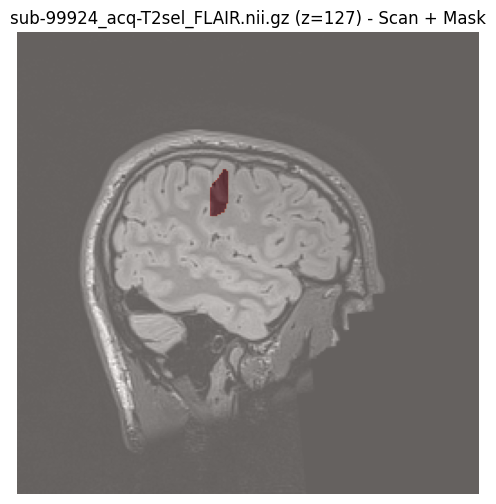

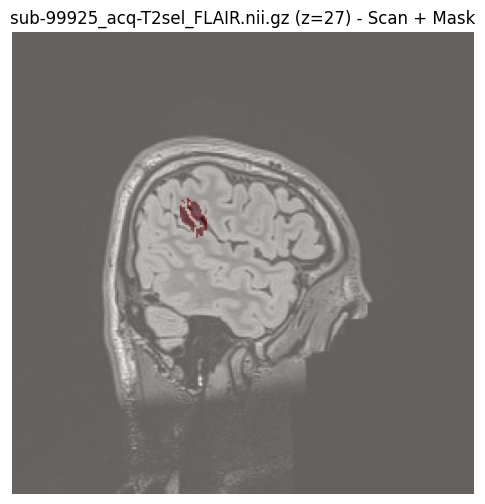

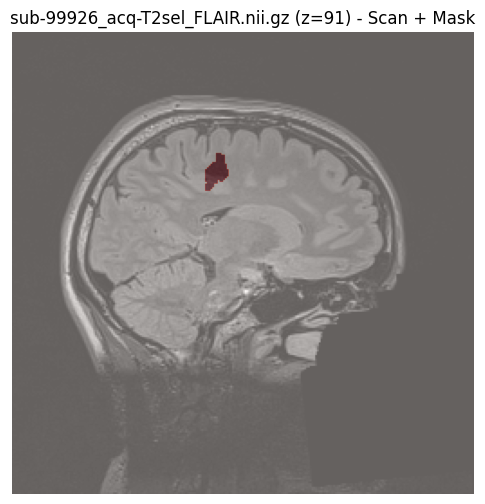

In [70]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import os

# Map each pair in filtered_pairs to a new unique ID (e.g., sub-99901, sub-99902, ...)
new_id_start = 99901
pair_id_map = {}
final_id_mapping = {}  # {new_id: (orig_img, orig_lbl)}
for idx, pair in enumerate(filtered_pairs):
    new_id = f"sub-{new_id_start + idx:05d}"
    pair_id_map[tuple(pair)] = new_id
    final_id_mapping[new_id] = {"image": pair[0], "label": pair[1]}

# Helper to get the new filename for a given original filename
def get_new_filename(orig_filename, new_id):
    # Replace the sub-XXXXX part with new_id
    parts = orig_filename.split('_', 1)
    if len(parts) == 2 and parts[0].startswith("sub-"):
        return f"{new_id}_{parts[1]}"
    else:
        # fallback: just prepend new_id
        return f"{new_id}_{orig_filename}"

filtered_pairs_renamed = []
for pair in filtered_pairs:
    orig_img, orig_lbl = pair
    new_id = pair_id_map[tuple(pair)]
    new_img_name = get_new_filename(orig_img, new_id)
    new_lbl_name = get_new_filename(orig_lbl, new_id)

    # Rename image file
    src_img_path = os.path.join("./sampling_images", orig_img)
    dst_img_path = os.path.join("./sampling_images", new_img_name)
    if os.path.exists(src_img_path):
        os.rename(src_img_path, dst_img_path)
        print(f"Renamed image: {orig_img} -> {new_img_name}")
    else:
        print(f"Image file not found for renaming: {src_img_path}")

    # Rename label file
    src_lbl_path = os.path.join("./sampling_labels", orig_lbl)
    dst_lbl_path = os.path.join("./sampling_labels", new_lbl_name)
    if os.path.exists(src_lbl_path):
        os.rename(src_lbl_path, dst_lbl_path)
        print(f"Renamed label: {orig_lbl} -> {new_lbl_name}")
    else:
        print(f"Label file not found for renaming: {src_lbl_path}")

    filtered_pairs_renamed.append((new_img_name, new_lbl_name))
    # Update mapping to include new file names
    final_id_mapping[new_id]["renamed_image"] = new_img_name
    final_id_mapping[new_id]["renamed_label"] = new_lbl_name

# Overwrite filtered_pairs with the renamed version:
filtered_pairs = filtered_pairs_renamed

print(final_id_mapping)

# Display each pair to ensure the new IDs work (from sampling_images and sampling_labels)
for img_fn, lbl_fn in filtered_pairs:
    scan_path = os.path.join("./sampling_images", img_fn)
    mask_path = os.path.join("./sampling_labels", lbl_fn)

    if not os.path.exists(scan_path):
        print(f"Image file not found: {scan_path}")
        continue
    if not os.path.exists(mask_path):
        print(f"Label file not found: {mask_path}")
        continue

    scan_nii = nib.load(scan_path)
    mask_nii = nib.load(mask_path)
    scan = scan_nii.get_fdata()
    mask = mask_nii.get_fdata()

    mask_indices = np.argwhere(mask > 0.5)
    if mask_indices.size == 0:
        print(f"No mask found for {lbl_fn}")
        continue
    center_idx = np.mean(mask_indices, axis=0).astype(int)
    z, y, x = center_idx

    fig, axs = plt.subplots(1, 1, figsize=(6, 6))

    scan_slice = scan[z, :, :]
    mask_slice = mask[z, :, :]
    axs.imshow(scan_slice.T, cmap='gray', origin='lower')
    axs.imshow(mask_slice.T, cmap='Reds', alpha=0.4, origin='lower')
    axs.set_title(f"{img_fn} (z={z}) - Scan + Mask")
    axs.axis('off')

    plt.show()